<a href="https://colab.research.google.com/github/hhhhhhhhhhhhhhhhho/AI/blob/master/AutoEncoder_Abnormal_Detecting/AutoEncoder_CICIDS2017_Anomal_Detecting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 시행착오
> 데이터 전처리로 해결 함.

In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
from scipy import stats
import tensorflow as tf
import seaborn as sns
from pylab import rcParams
from sklearn.model_selection import train_test_split
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import regularizers

데이터의 형태를 먼저 살펴본다.

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/인공지능 보안/Data_Set /MachineLearningCVE/Wednesday-workingHours.pcap_ISCX.csv")

In [ ]:
df.shape

(692703, 79)

In [ ]:
display(df)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,3.132505e+02,52.208416,38308.000000,0.000000,38308,38308,0,0.000000,0.000000,0,0,0,0.000000,0.000000,0,0,0,0,0,0,20,20,26.104208,26.104208,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,255,946,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,389,479,11,5,172,326,79,0,15.636364,31.449238,163,0,65.200000,89.278777,1.039666e+06,33402.922760,31.933333,25.510409,73,0,479,47.900000,38.942836,109,1,401,100.250000,101.736178,237,3,0,0,0,0,368,176,22964.509390,10438.413360,0,163,29.294118,56.529599,3195.595588,0,0,0,1,0,0,0,0,0,31.125000,15.636364,65.200000,368,0,0,0,0,0,0,11,172,5,326,29200,260,4,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,1575,0,525.000000,813.326503,5.753425e+06,14611.872150,73.000000,204.960972,810,1,1095,121.666667,298.746130,915,1,995,199.000000,345.535092,810,3,0,0,0,0,336,208,9132.420091,5479.452055,0,1575,370.588235,671.751541,451250.132400,0,0,0,1,0,0,0,0,0,393.750000,315.000000,525.000000,336,0,0,0,0,0,0,10,3150,6,3150,29200,2081,3,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,389,15206,17,12,3452,6660,1313,0,203.058824,425.778474,3069,0,555.000000,977.480342,6.650007e+05,1907.141918,543.071429,2519.931377,13391,0,15206,950.375000,3322.417812,13391,2,15112,1373.818182,4176.449588,13961,3,0,0,0,0,560,388,1117.979745,789.162173,0,3069,337.066667,704.654082,496537.374700,0,0,0,1,0,0,0,0,0,348.689655,203.058824,555.000000,560,0,0,0,0,0,0,17,3452,12,6660,29200,0,10,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,1576,0,525.333333,813.842901,5.771062e+06,13736.263740,78.000000,207.000929,794,1,1092,136.500000,313.850738,910,1,1015,203.000000,333.240154,794,3,0,0,0,0,304,208,8241.758242,5494.505495,0,1576,393.875000,704.585067,496440.116700,0,0,0,1,0,0,0,0,0,420.133333,350.000000,525.333333,304,0,0,0,0,0,0,9,3150,6,3152,29200,2081,2,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.000000,0.000000,76,76,76.000000,0.000000,8.194940e+03,186.248642,6443.000000,13617.579480,30780,3,30832,10277.333330,17755.843810,30780,4,3,3.000000,0.000000,3,3,0,0,0,0,80,64,124.165761,62.082881,28,76,41.714286,23.421602,548.571429,0,0,0,0,0,0,0,0,0,48.666667,28.000000,76.000000,80,0,0,0,0,0,0,4,112,2,152,-1,-1,3,20,0.0,0.0,0,0,0.0,0.0,0,0,B

데이터는 79 개의 column 으로 구성되어 있다.   
Data = "/content/Wednesday-workingHours.pcap_ISCX.csv"


* 정상 데이터와 이상 데이터 양의 차이를 비교해보자. 

불균형 데이터의 경우 confusion matrix 에서 오탐이 발생 할 수 있다. 

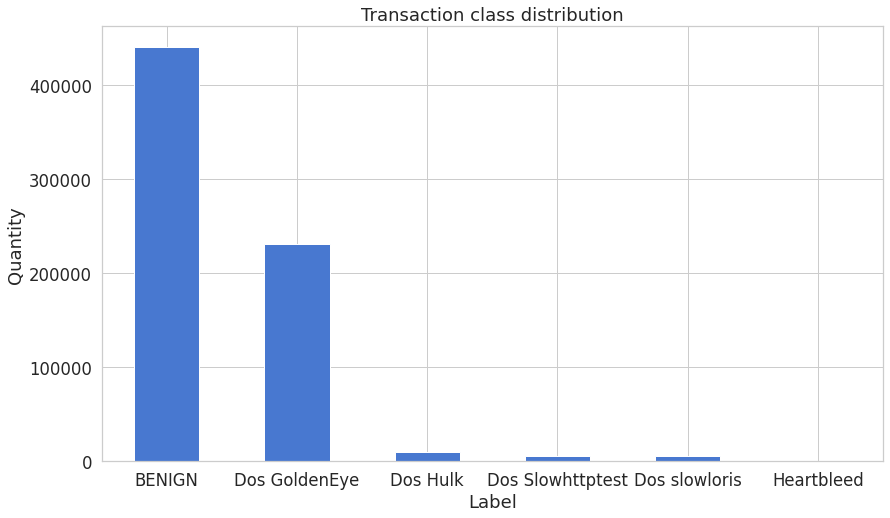

In [ ]:
# 시각화 라이브러리 설정
%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 14, 8

# RANDOM_SEED와 LABELS 설정
RANDOM_SEED = 42
LABELS = ["BENIGN","Dos GoldenEye","Dos Hulk","Dos Slowhttptest","Dos slowloris","Heartbleed"]

count_classes = pd.value_counts(df[' Label'], sort = True)
count_classes.plot(kind = 'bar', rot=0)
plt.title("Transaction class distribution")
plt.xticks(range(6), LABELS)
plt.xlabel("Label")
plt.ylabel("Quantity");

In [ ]:
normal = df[df[' Label'] == 'BENIGN']
malicious = df[df[' Label'] == 'DoS GoldenEye']

print("normal data shape : ",normal.shape)
print("malicious data shape : ",malicious.shape)

normal data shape :  (440031, 79)
malicious data shape :  (10293, 79)


### 데이터 사용 이전에 결측치 확인 해보자.

In [ ]:
df.info()
df.isnull().sum()

### 정상 데이터만을 학습 시킬 것이니까, 정상 데이터만 추출한 뒤 학습 시킨다. 

In [ ]:
df_benign = normal

오토인코더에서 Label 은 필요 없는 항목이니, 제거 해준다.

In [ ]:
#display(df_benign)
df_benign= df_benign.drop([' Label'],axis=1)
df_benign.reset_index(drop=True)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,3.132505e+02,52.208416,38308.000000,0.000000,38308,38308,0,0.000000,0.000000,0,0,0,0.000000,0.000000,0,0,0,0,0,0,20,20,26.104208,26.104208,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,255,946,0,20,0.0,0.0,0,0,0.0,0.0,0,0
1,389,479,11,5,172,326,79,0,15.636364,31.449238,163,0,65.200000,89.278777,1.039666e+06,33402.922760,31.933333,25.510409,73,0,479,47.900000,38.942836,109,1,401,100.250000,101.736178,237,3,0,0,0,0,368,176,22964.509390,10438.413360,0,163,29.294118,56.529599,3195.595588,0,0,0,1,0,0,0,0,0,31.125000,15.636364,65.200000,368,0,0,0,0,0,0,11,172,5,326,29200,260,4,32,0.0,0.0,0,0,0.0,0.0,0,0
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,1575,0,525.000000,813.326503,5.753425e+06,14611.872150,73.000000,204.960972,810,1,1095,121.666667,298.746130,915,1,995,199.000000,345.535092,810,3,0,0,0,0,336,208,9132.420091,5479.452055,0,1575,370.588235,671.751541,451250.132400,0,0,0,1,0,0,0,0,0,393.750000,315.000000,525.000000,336,0,0,0,0,0,0,10,3150,6,3150,29200,2081,3,32,0.0,0.0,0,0,0.0,0.0,0,0
3,389,15206,17,12,3452,6660,1313,0,203.058824,425.778474,3069,0,555.000000,977.480342,6.650007e+05,1907.141918,543.071429,2519.931377,13391,0,15206,950.375000,3322.417812,13391,2,15112,1373.818182,4176.449588,13961,3,0,0,0,0,560,388,1117.979745,789.162173,0,3069,337.066667,704.654082,496537.374700,0,0,0,1,0,0,0,0,0,348.689655,203.058824,555.000000,560,0,0,0,0,0,0,17,3452,12,6660,29200,0,10,32,0.0,0.0,0,0,0.0,0.0,0,0
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,1576,0,525.333333,813.842901,5.771062e+06,13736.263740,78.000000,207.000929,794,1,1092,136.500000,313.850738,910,1,1015,203.000000,333.240154,794,3,0,0,0,0,304,208,8241.758242,5494.505495,0,1576,393.875000,704.585067,496440.116700,0,0,0,1,0,0,0,0,0,420.133333,350.000000,525.333333,304,0,0,0,0,0,0,9,3150,6,3152,29200,2081,2,32,0.0,0.0,0,0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440026,53,32215,4,2,112,152,28,28,28.000000,0.000000,76,76,76.000000,0.000000,8.194940e+03,186.248642,6443.000000,13617.579480,30780,3,30832,10277.333330,17755.843810,30780,4,3,3.000000,0.000000,3,3,0,0,0,0,80,64,124.165761,62.082881,28,76,41.714286,23.421602,548.571429,0,0,0,0,0,0,0,0,0,48.666667,28.000000,76.000000,80,0,0,0,0,0,0,4,112,2,152,-1,-1,3,20,0.0,0.0,0,0,0.0,0.0,0,0
440027,53,324,2,2,84,362,42,42,42.000000,0.000

In [ ]:
X_train, X_test = train_test_split(df_benign, test_size=0.3, random_state=RANDOM_SEED)
y_test = X_test
X_train = X_train.values.astype('int64') # np.float32 로 바꿔서 해보자. 
X_test = X_test.values.astype('int64') #astype(float) -> astype(np.float32)

X_train.shape

(308021, 78)

Auto Encoder 는 5개의 Fully - Connected - Layer 로 만들어져 있고 

78 - 39 - 18 - 9 - 4 - 9 - 18 - 39 - 78 로 훈련 시킨다. 

L1 정규화를 사용함. ( AE with Weight Decay )

In [ ]:
input_dim = X_train.shape[1]
encoding_dim = 50
'''
input_layer = Input(shape=(input_dim, )) # 78
encoder1 = Dense(encoding_dim, activation="tanh")(input_layer) # 50
encoder1 = tf.keras.layers.Dropout(0.2)(encoder1)
encoder2 = Dense(int(encoding_dim / 2), activation="relu")(encoder1) # 25
Latent = Dense(int(encoding_dim / 4), activation=tf.nn.leaky_relu)(encoder2) # 12
decoder1 = Dense(int(encoding_dim / 2), activation='relu')(Latent) # 25 
decoder1 = tf.keras.layers.Dropout(0.2)(decoder1)
decoder2 = Dense(encoding_dim, activation='relu')(decoder1) # 50
output_layer = Dense(X_train.shape[1], activation='tanh')(decoder2) # 78
autoencoder = Model(inputs=input_layer, outputs=output_layer)
'''
'''
input_layer = Input(shape=(input_dim, )) # 78
encoder0 = Dense(65, activation="tanh")(input_layer) # 65
encoder1 = Dense(int(encoding_dim), activation="relu")(encoder0) # 50
encoder2 = Dense(int(encoding_dim / 2), activation="relu")(encoder1) # 25
Latent = Dense(int(encoding_dim / 4), activation=tf.nn.leaky_relu)(encoder2) # 12
decoder1 = Dense(int(encoding_dim / 2), activation='relu')(Latent) # 25 
decoder2 = Dense(encoding_dim, activation='relu')(decoder1) # 50
decoder3 = Dense(65, activation='tanh')(decoder2) # 65
output_layer = Dense(X_train.shape[1], activation='tanh')(decoder3) # 78
autoencoder = Model(inputs=input_layer, outputs=output_layer)
'''
'''
#### Summary  78 - 70 - 65 - 50 - 30 - 20 - 10 - 5 - 10 - 20 - 30 - 50 - 65 - 78
input_layer = Input(shape=(input_dim, )) # 78
encoder1 = Dense(70, activation="tanh")(input_layer) # 70
encoder2 = Dense(65, activation="relu")(encoder1) # 65
encoder3 = Dense(50, activation="relu")(encoder2)  # 50
encoder4 = Dense(50, activation="relu")(encoder3) # 30
encoder5 = Dense(50, activation="relu")(encoder4) # 20
encoder6 = Dense(50, activation="relu")(encoder5) # 10
Latent = Dense(5, activation=tf.nn.leaky_relu)(encoder6) # 5
decoder1 = Dense(10, activation='relu')(Latent) # 10
decoder2 = Dense(20, activation='relu')(decoder1) # 20
decoder3 = Dense(30, activation='relu')(decoder2) # 30
decoder4 = Dense(50, activation='relu')(decoder3) # 50
decoder5 = Dense(65, activation='relu')(decoder4) # 65
decoder6 = Dense(70, activation='tanh')(decoder5) # 65
output_layer = Dense(X_train.shape[1], activation='tanh')(decoder6) # 78
autoencoder = Model(inputs=input_layer, outputs=output_layer)
'''

#### Summary  78 - 75 - 70 - 65 - 60 - 55 ~ 5 단위로 차원 줄여 봄. 
input_layer = Input(shape=(input_dim, )) # 78
encoder1 = Dense(75, activation="tanh")(input_layer) # 75
encoder2 = Dense(70, activation="relu")(encoder1) # 65
encoder3 = Dense(65, activation="relu")(encoder2) # 65
encoder4 = Dense(60, activation="relu")(encoder3) # 65
encoder5 = Dense(55, activation="relu")(encoder4) # 65
encoder6 = Dense(50, activation="relu")(encoder5) # 65
encoder7 = Dense(45, activation="relu")(encoder6) # 65
encoder8 = Dense(40, activation="relu")(encoder7) # 65
encoder9 = Dense(35, activation="relu")(encoder8) # 65
encoder10 = Dense(30, activation="relu")(encoder9) # 65
encoder11 = Dense(25, activation="relu")(encoder10) # 65
encoder12 = Dense(20, activation="relu")(encoder11) # 65
encoder13 = Dense(15, activation="relu")(encoder12)  # 50
encoder14 = Dense(10, activation="relu")(encoder13) # 30
Latent = Dense(5, activation=tf.nn.leaky_relu)(encoder14) # 5
decoder1 = Dense(10, activation='relu')(Latent) # 10
decoder2 = Dense(15, activation='relu')(decoder1) # 10
decoder3 = Dense(20, activation='relu')(decoder2) # 10
decoder4 = Dense(25, activation='relu')(decoder3) # 10
decoder5 = Dense(30, activation='relu')(decoder4) # 10
decoder6 = Dense(35, activation='relu')(decoder5) # 10
decoder7 = Dense(40, activation='relu')(decoder6) # 10
decoder8 = Dense(45, activation='relu')(decoder7) # 10
decoder9 = Dense(50, activation='relu')(decoder8) # 10
decoder10 = Dense(55, activation='relu')(decoder9) # 10
decoder11 = Dense(60, activation='relu')(decoder10) # 10
decoder12 = Dense(65, activation='relu')(decoder11) # 10
decoder13 = Dense(70, activation='relu')(decoder12) # 10
decoder14 = Dense(75, activation='relu')(decoder13) # 10
output_layer = Dense(78, activation='tanh')(decoder14)
autoencoder = Model(inputs=input_layer, outputs=output_layer)


'''
### 56개 차원으로 플래그를 삭제 해 보고 나서 설계한 모델 

input_layer = Input(shape=(input_dim, )) # 56
encoder0 = Dense(40, activation="tanh")(input_layer) # 40
encoder1 = Dense(25, activation="relu")(encoder0) # 25
encoder2 = Dense(10, activation="relu")(encoder1) # 10
Latent = Dense(5, activation=tf.nn.leaky_relu)(encoder2) # 5
decoder1 = Dense(10, activation='relu')(Latent) # 10
decoder2 = Dense(25, activation='relu')(decoder1) # 25
decoder3 = Dense(40, activation='tanh')(decoder2) # 40
output_layer = Dense(X_train.shape[1], activation='tanh')(decoder3) # 56
autoencoder = Model(inputs=input_layer, outputs=output_layer)
'''

'''
### 플래그 삭제 후 39차원으로 축소 한 뒤 설계한 모델
input_layer = Input(shape=(input_dim, )) # 39
encoder0 = Dense(20, activation="tanh")(input_layer) # 20
encoder1 = Dense(15, activation="relu")(encoder0) # 15
encoder2 = Dense(10, activation="relu")(encoder1) # 10
Latent = Dense(5, activation=tf.nn.leaky_relu)(encoder2) # 5
decoder1 = Dense(10, activation='relu')(Latent) # 10
decoder2 = Dense(15, activation='relu')(decoder1) # 15
decoder3 = Dense(20, activation='tanh')(decoder2) # 20
output_layer = Dense(X_train.shape[1], activation='tanh')(decoder3) # 39
autoencoder = Model(inputs=input_layer, outputs=output_layer)
'''



In [ ]:
autoencoder.summary()

In [ ]:
#@title 기본 제목 텍스트
nb_epoch = 20
batch_size = 10000
adam = tf.keras.optimizers.Adam(learning_rate=1)
autoencoder.compile(optimizer=adam, 
                    loss='mean_squared_error', 
                    metrics=['accuracy'])

checkpointer = ModelCheckpoint(filepath="model.h5", ## model 을 m5 파일 형태로 저장함. 
                               mode='min',
                               monitor='val_loss',
                               verbose=2,
                               save_best_only=True)


tensorboard = TensorBoard(log_dir='./logs',
                          histogram_freq=0,
                          write_graph=True,
                          write_images=True)


history = autoencoder.fit(X_train, X_train,
                    epochs=nb_epoch,
                    batch_size=batch_size,
                    shuffle=True,
                    validation_data=(X_test, X_test),
                    verbose=1,
                    callbacks=[checkpointer, tensorboard]).history

Epoch 1/20
31/31 [==============================] - 11s 279ms/step - loss: nan - accuracy: 0.0484 - val_loss: nan - val_accuracy: 0.0487

Epoch 00001: val_loss did not improve from inf
Epoch 2/20
31/31 [==============================] - 7s 243ms/step - loss: nan - accuracy: 0.0481 - val_loss: nan - val_accuracy: 0.0487

Epoch 00002: val_loss did not improve from inf
Epoch 3/20
31/31 [==============================] - 8s 245ms/step - loss: nan - accuracy: 0.0486 - val_loss: nan - val_accuracy: 0.0487

Epoch 00003: val_loss did not improve from inf
Epoch 4/20
31/31 [==============================] - 7s 244ms/step - loss: nan - accuracy: 0.0490 - val_loss: nan - val_accuracy: 0.0487

Epoch 00004: val_loss did not improve from inf
Epoch 5/20
31/31 [==============================] - 8s 246ms/step - loss: nan - accuracy: 0.0483 - val_loss: nan - val_accuracy: 0.0487

Epoch 00005: val_loss did not improve from inf
Epoch 6/20
31/31 [==============================] - 8s 255ms/step - loss: nan -

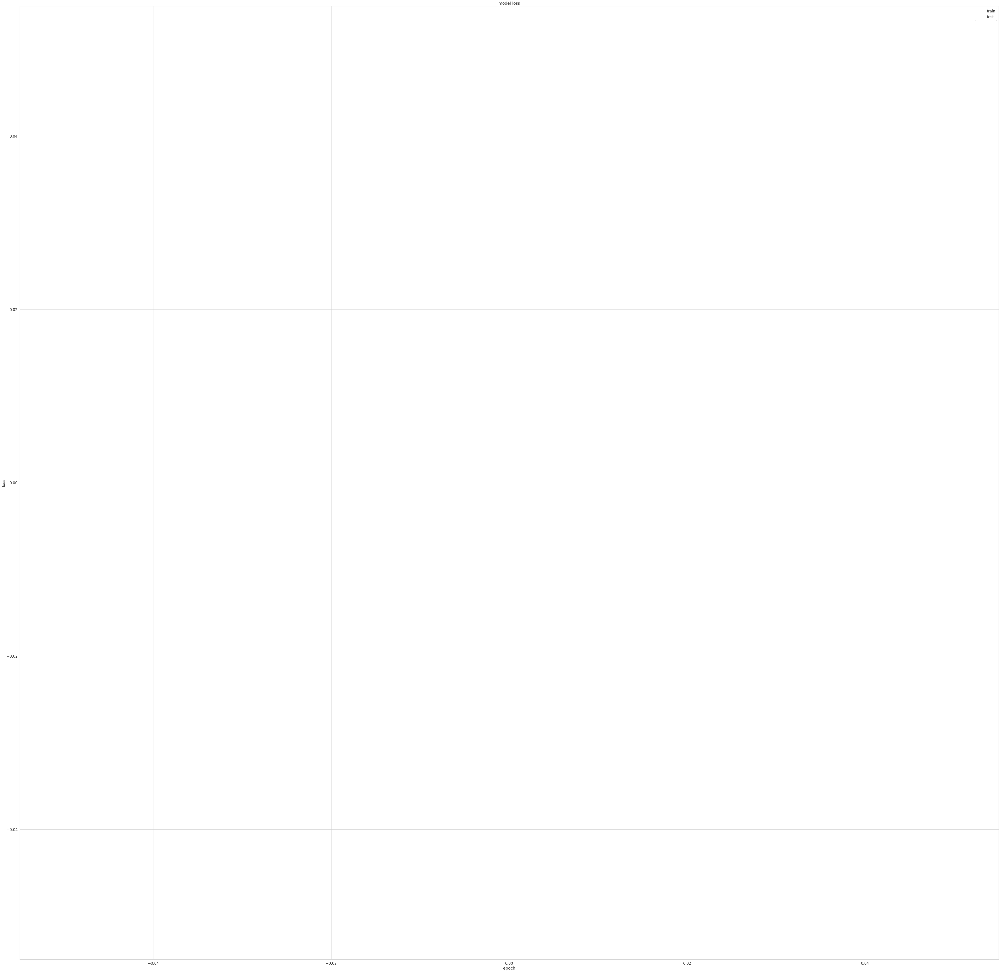

In [ ]:
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right');

## 학습이 되지 않는것에 대한 개선

1. 78개의 차원이 각각에 너무 다른 데이터를 나타내고 있기 때문에 학습이 잘 안될 수도 있다. 정규화가 불가능하니. 관계없는 data 를 줄이기 위한 방법을 알아보자. 

* test1. 라벨마다 각 튜플 평균을 내서 라벨별로 차이가 없거나 근소한 튜플을 학습에서 배제시킨다.
  - Correlataion 분석으로 의미없는 데이터가 어떤건지 확인해보자.

* test2. 결측치 검사 

* test3. Standart Scaler 사용 < 실패 > 

### Correlation 분석

평균값과 똑같은 플래그들을 제거 한 데이터로 correlation 검사를 진행함.

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/인공지능 보안/Data_Set /MachineLearningCVE/AutoEncoder_Test/Wednesday-workingHours.pcap_ISCX_플래그삭제+최대최소값삭제.csv')

In [ ]:
display(df)

In [ ]:
#normal = df[df[' Label'] == 'BENIGN']
#malicious = df[df[' Label'] == 'DoS GoldenEye']



df.loc[(df[' Label']== 'BENIGN'),' Label'] = 0
df.loc[(df[' Label']== 'DoS GoldenEye'),' Label'] = 1
df.loc[(df[' Label']==  'DoS Hulk'),' Label'] = 1
df.loc[(df[' Label']==  'DoS Slowhttptest'),' Label'] = 1
df.loc[(df[' Label']==  'DoS slowloris'),' Label'] = 1
df.loc[(df[' Label']==  'Heartbleed'),' Label'] = 1

#df = df.drop([' Label'], axis = 1)
#malicious = malicious.drop([' Label'], axis = 1)

print(df)

         Destination Port   Flow Duration  ...   Idle Min   Label
0                      80           38308  ...          0       0
1                     389             479  ...          0       0
2                      88            1095  ...          0       0
3                     389           15206  ...          0       0
4                      88            1092  ...          0       0
...                   ...             ...  ...        ...     ...
692698                 53           32215  ...          0       0
692699                 53             324  ...          0       0
692700              58030              82  ...          0       0
692701                 53         1048635  ...          0       0
692702                 53           94939  ...          0       0

[692703 rows x 79 columns]


In [ ]:
display(df.isnull().sum())
df[' Label'].astype('int64')
#display(normal.isnull().sum())
#display(malicious.isnull().sum())



 Destination Port              0
 Flow Duration                 0
 Total Fwd Packets             0
 Total Backward Packets        0
Total Length of Fwd Packets    0
                              ..
Idle Mean                      0
 Idle Std                      0
 Idle Max                      0
 Idle Min                      0
 Label                         0
Length: 79, dtype: int64

0         0
1         0
2         0
3         0
4         0
         ..
692698    0
692699    0
692700    0
692701    0
692702    0
Name:  Label, Length: 692703, dtype: int64

In [ ]:
 df.dropna()
 print(type(df))
 df.shape
#print(normal.shape)
#print(malicious.shape)

<class 'pandas.core.frame.DataFrame'>


(692703, 79)

Exception ignored in: <function IteratorResourceDeleter.__del__ at 0x7fc98b30cb00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py", line 546, in __del__
    handle=self._handle, deleter=self._deleter)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/gen_dataset_ops.py", line 1264, in delete_iterator
    _ctx, "DeleteIterator", name, handle, deleter)
KeyboardInterrupt: 
Exception ignored in: <function IteratorResourceDeleter.__del__ at 0x7fc98b30cb00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py", line 546, in __del__
    handle=self._handle, deleter=self._deleter)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/gen_dataset_ops.py", line 1264, in delete_iterator
    _ctx, "DeleteIterator", name, handle, deleter)
KeyboardInterrupt: 


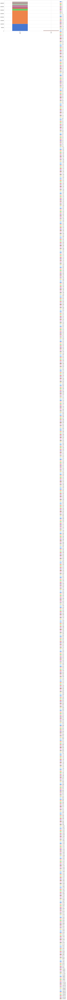

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams['axes.grid'] = True 

def bar_chart(feature):
    good = normal[feature].value_counts()
    mal = malicious[feature].value_counts()
    df = pd.DataFrame([good,mal])
    df.index = ['good','mal']
    df.plot(kind='bar',stacked=True)
'''
for label_name in label_list:
  print("Label name : ", label_name)

  bar_chart(label_name)
'''

bar_chart(' Total Fwd Packets')

In [ ]:
display(df)

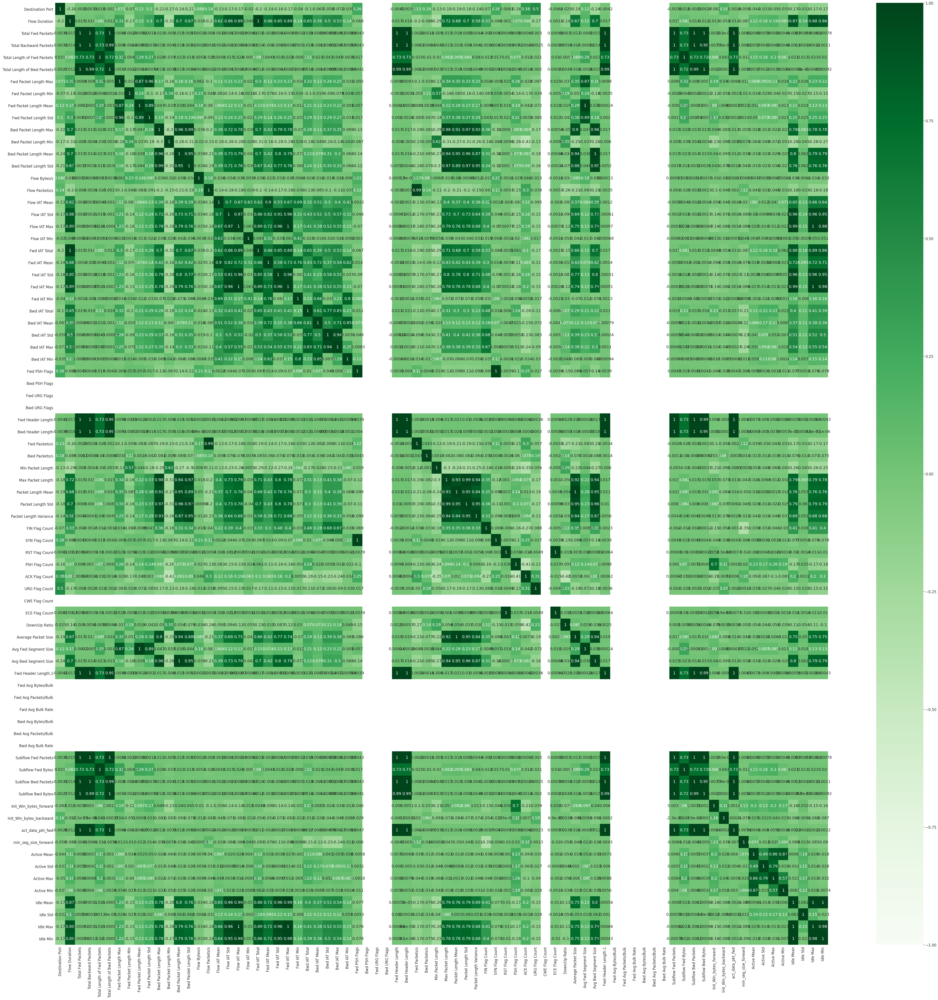

In [ ]:
import seaborn as sb

plt.rcParams["figure.figsize"]=(79,79)
sb.heatmap(df.corr(),annot= True,
           cmap = 'Greens',
           vmin = -1, vmax= 1,
)

### Standart Sclaer

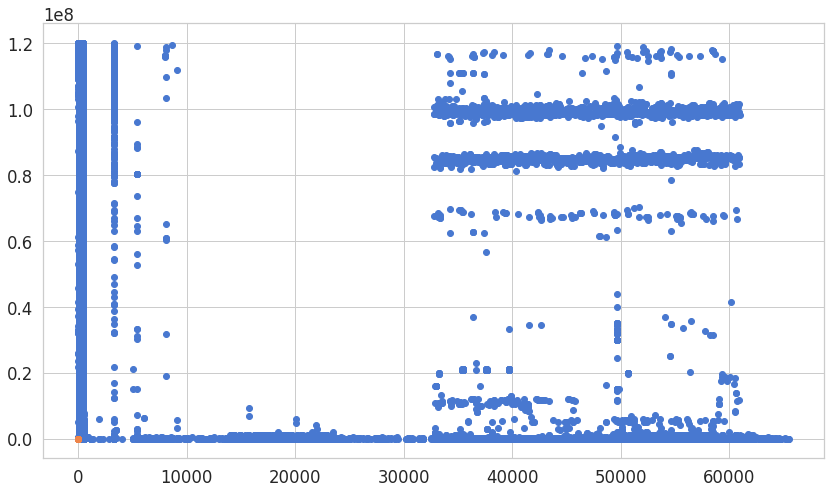

In [ ]:
#df_benign=df_benign.drop(' Label',axis=1)
X_train, X_test = train_test_split(df_benign, test_size=0.3, random_state=RANDOM_SEED)
y_test = X_test
X_train = X_train.values.astype('int64') # np.float32 로 바꿔서 해보자. 
X_test = X_test.values.astype('int64') #astype(float) -> astype(np.float32)


# 평균 0, 분산 1을 갖도록 스케일 조정
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split


plt1=plt.scatter(X_train[:,0],X_train[:,1])

scaler = StandardScaler()
scaler.fit_transform(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X, _ = make_blobs(n_samples= 200, centers= 5, random_state=4, cluster_std=1.5)
plt2= plt.scatter(X_train_scaled[:,0],X_train_scaled[:,1])



# 결과 
| CICIDS 2017 Network Traffic Data Anomaly Detecting Using AutoEncoder

In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
from scipy import stats
import tensorflow as tf
import seaborn as sns
from pylab import rcParams
from sklearn.model_selection import train_test_split
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import regularizers
import pickle
from scipy import stats
from pylab import rcParams

from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,
                             roc_curve, recall_score, classification_report, f1_score,
                             precision_recall_fscore_support)

%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 14, 8

* 데이터 불러오기
AutoEncoder 는 정상데이터로만 학습을 해야하므로 BENIGN 데이터만 존재하는 Monday-WorkingHOurs.pcap.ISCX 데이터로 학습 시킨다. 

In [2]:
df = pd.read_csv('/content/drive/MyDrive/인공지능 보안/Data_Set /MachineLearningCVE/Monday-WorkingHours.pcap_ISCX.csv')

### One - Hot Encoding 이후 Correlation 으로 상관있는 데이터들 추출 .

In [3]:
df2_dummie = pd.get_dummies(df)
df = df2_dummie

* 이 데이터에는 결측치는 없지만 결측치 검사를 해준다. 

In [4]:
df2_dummie= df2_dummie.astype('float64')
df2_dummie.isnull().sum()
df2_dummie.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 529918 entries, 0 to 529917
Data columns (total 79 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0    Destination Port             529918 non-null  float64
 1    Flow Duration                529918 non-null  float64
 2    Total Fwd Packets            529918 non-null  float64
 3    Total Backward Packets       529918 non-null  float64
 4   Total Length of Fwd Packets   529918 non-null  float64
 5    Total Length of Bwd Packets  529918 non-null  float64
 6    Fwd Packet Length Max        529918 non-null  float64
 7    Fwd Packet Length Min        529918 non-null  float64
 8    Fwd Packet Length Mean       529918 non-null  float64
 9    Fwd Packet Length Std        529918 non-null  float64
 10  Bwd Packet Length Max         529918 non-null  float64
 11   Bwd Packet Length Min        529918 non-null  float64
 12   Bwd Packet Length Mean       529918 non-nul

* Correlation 검사

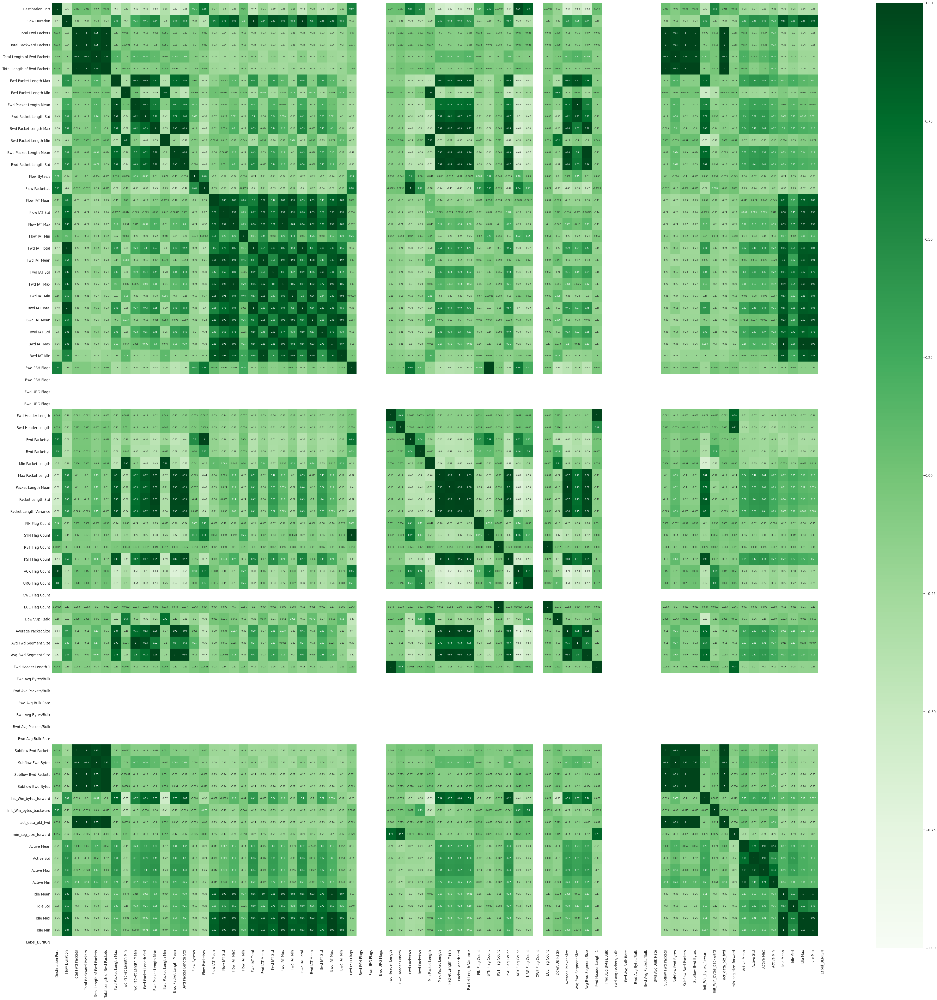

In [5]:
df2_dummie.dropna() # 결측치 제거 
df_corr = df2_dummie.corr()

plt.rcParams["figure.figsize"]=(84,84)
sns.heatmap(df_corr.corr(),annot= True,
           cmap = 'Greens',
           vmin = -1, vmax= 1,
)

BENIGN 에서 corr > | 0.7 | 인 Feature 들 나열. 
* Flow Duration : Microsecond 단위에서 흐름의 기간
* Bwd Packet Length Max : 역방향 패킷의 최대 사이즈 
* Bwd Packet Length Min : 역방향 패킷의 최소 사이즈
* Bwd Packet Length Mean : 역방향 패킷의 평균 사이즈 
* Bwd Packet Length Std : 역방향 패킷의 표준편차 사이즈 
* Flow IAT Mean : 두 패킷 사이의 평균 시간 
* Flow IAT Std : 두 패킷 사이의 표준편차
* Flow IAT Max : 두 패킷 사이의 최대 시간 
* Min Packet Length : 최소 패킷 길이 
* Max Packet Length : 최대 패킷 길이 
* Packet Length Mean : 패킷 길이 평균
* Packet Length Std : 패킷 길이 표준편차 
* Packet Length Variance : 패킷 길이 분산
* FIN Flag Count : FIN flag 의 개수e=
* Average Packet Size : 평균 패킷 사이즈 
* Avg Bwd Segment Size : 평균 Backward Segement size
* Idle Mean : 유휴 상태였던 평균 시간
* Idle Max : 유휴 상태였던 최대 시간
* Idle Min : 유휴 상태였던 최소 시간 



In [6]:
### 20개로 Feature 줄임. < Label BENIGN 추가 > 
#df_benign= df[df[' Label']== 'BENIGN']
df_benign_corr_ont_hot_feature = df.loc[:,[' Flow Duration','Bwd Packet Length Max',' Bwd Packet Length Min',' Bwd Packet Length Mean',
                           ' Bwd Packet Length Std',' Flow IAT Mean',' Flow IAT Std',' Flow IAT Max',' Min Packet Length',
                           ' Max Packet Length',' Packet Length Mean',' Packet Length Std',' Packet Length Variance','FIN Flag Count',
                           ' Average Packet Size',' Avg Bwd Segment Size','Idle Mean',' Idle Max',' Idle Min',' Label_BENIGN']]

display(df_benign_corr_ont_hot_feature )

,Flow Duration,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,Average Packet Size,Avg Bwd Segment Size,Idle Mean,Idle Max,Idle Min,Label_BENIGN
0,4,0,0,0.0,0.0,4.000000,0.000000,4,6,6,6.0,0.000000,0.0,0,9.0,0.0,0.0,0,0,1
1,1,0,0,0.0,0.0,1.000000,0.000000,1,6,6,6.0,0.000000,0.0,0,9.0,0.0,0.0,0,0,1
2,1,0,0,0.0,0.0,1.000000,0.000000,1,6,6,6.0,0.000000,0.0,0,9.0,0.0,0.0,0,0,1
3,1,0,0,0.0,0.0,1.000000,0.000000,1,6,6,6.0,0.000000,0.0,0,9.0,0.0,0.0,0,0,1
4,3,0,0,0.0,0.0,3.000000,0.000000,3,6,6,6.0,0.000000,0.0,0,9.0,0.0,0.0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
529913,18738,6,6,6.0,0.0,18738.000000,0.000000,18738,6,6,6.0,0.000000,0.0,1,9.0,6.0,0.0,0,0,1
529914,60797,78,78,78.0,0.0,20265.666667,35095.968163,60791,40,78,55.2,20.813457,433.2,0,69.0,78.0,0.0,0,0,1
529915,154,48,48,48.0,0.0,51.333333,50.639247,104,32,48,38.4,8.763561,76.8,0,48.0,48.0,0.0,0,0,1
529916,155,72,72,72.0,0.0,51.666667,83.428612,148,40,72,52.8,17.527122,307.2,0,66.0,72.0,0.0,0,0,1


### 학습용이 아닌, 데이터 셋 불러오기.   
완전한 검증을 위해 완전 다른 데이터셋에서 Anomaly Detecting 하는 데이터셋

In [7]:
df2 = pd.read_csv("/content/drive/MyDrive/인공지능 보안/Data_Set /MachineLearningCVE/Wednesday-workingHours.pcap_ISCX.csv")

df2 = pd.get_dummies(df2)
df_anomaly_test_ont_hot_feature = df2.loc[:,[' Flow Duration','Bwd Packet Length Max',' Bwd Packet Length Min',' Bwd Packet Length Mean',
                           ' Bwd Packet Length Std',' Flow IAT Mean',' Flow IAT Std',' Flow IAT Max',' Min Packet Length',
                           ' Max Packet Length',' Packet Length Mean',' Packet Length Std',' Packet Length Variance','FIN Flag Count',
                           ' Average Packet Size',' Avg Bwd Segment Size','Idle Mean',' Idle Max',' Idle Min',' Label_BENIGN']]

### 정규화, 표준화, 데이터 쪼개기

정규화와 표준화 모두 시도했지만, 나는 min-max normalization 을 활용했다.

정상 플로우 데이터  70000개 로 학습을 진행했다. 

,Flow Duration,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,Average Packet Size,Avg Bwd Segment Size,Idle Mean,Idle Max,Idle Min,Label_BENIGN
0,4.166671e-08,0.000000,0.000000,0.000000,0.000000,5.193181e-08,0.000000,4.166853e-08,0.021898,0.000257,0.003196,0.000000,0.000000,0.0,0.004352,0.000000,0.0,0.0,0.0,0.0
1,1.666668e-08,0.000000,0.000000,0.000000,0.000000,2.077273e-08,0.000000,1.666741e-08,0.021898,0.000257,0.003196,0.000000,0.000000,0.0,0.004352,0.000000,0.0,0.0,0.0,0.0
2,1.666668e-08,0.000000,0.000000,0.000000,0.000000,2.077273e-08,0.000000,1.666741e-08,0.021898,0.000257,0.003196,0.000000,0.000000,0.0,0.004352,0.000000,0.0,0.0,0.0,0.0
3,1.666668e-08,0.000000,0.000000,0.000000,0.000000,2.077273e-08,0.000000,1.666741e-08,0.021898,0.000257,0.003196,0.000000,0.000000,0.0,0.004352,0.000000,0.0,0.0,0.0,0.0
4,3.333337e-08,0.000000,0.000000,0.000000,0.000000,4.154545e-08,0.000000,3.333483e-08,0.021898,0.000257,0.003196,0.000000,0.000000,0.0,0.004352,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,1.129975e-02,0.008828,0.045806,0.031415,0.011662,4.694535e-03,0.010559,1.079111e-02,0.156934,0.004966,0.035157,0.006764,0.000046,0.0,0.039894,0.031415,0.0,0.0,0.0,0.0
69996,2.539753e-04,0.008371,0.070968,0.036958,0.000000,3.165452e-04,0.000000,2.539864e-04,0.197080,0.004709,0.038709,0.007324,0.000054,0.0,0.052708,0.036958,0.0,0.0,0.0,0.0
69997,5.105589e-04,0.014307,0.121290,0.063165,0.000000,6.363413e-04,0.000000,5.105812e-04,0.204380,0.008048,0.053269,0.017263,0.000298,0.0,0.072534,0.063165,0.0,0.0,0.0,0.0
69998,2.599253e-04,0.005784,0.049032,0.025535,0.000000,3.239610e-04,0.000000,2.599366e-04,0.218978,0.003253,0.034802,0.002093,0.000004,0.0,0.047389,0.025535,0.0,0.0,0.0,0.0


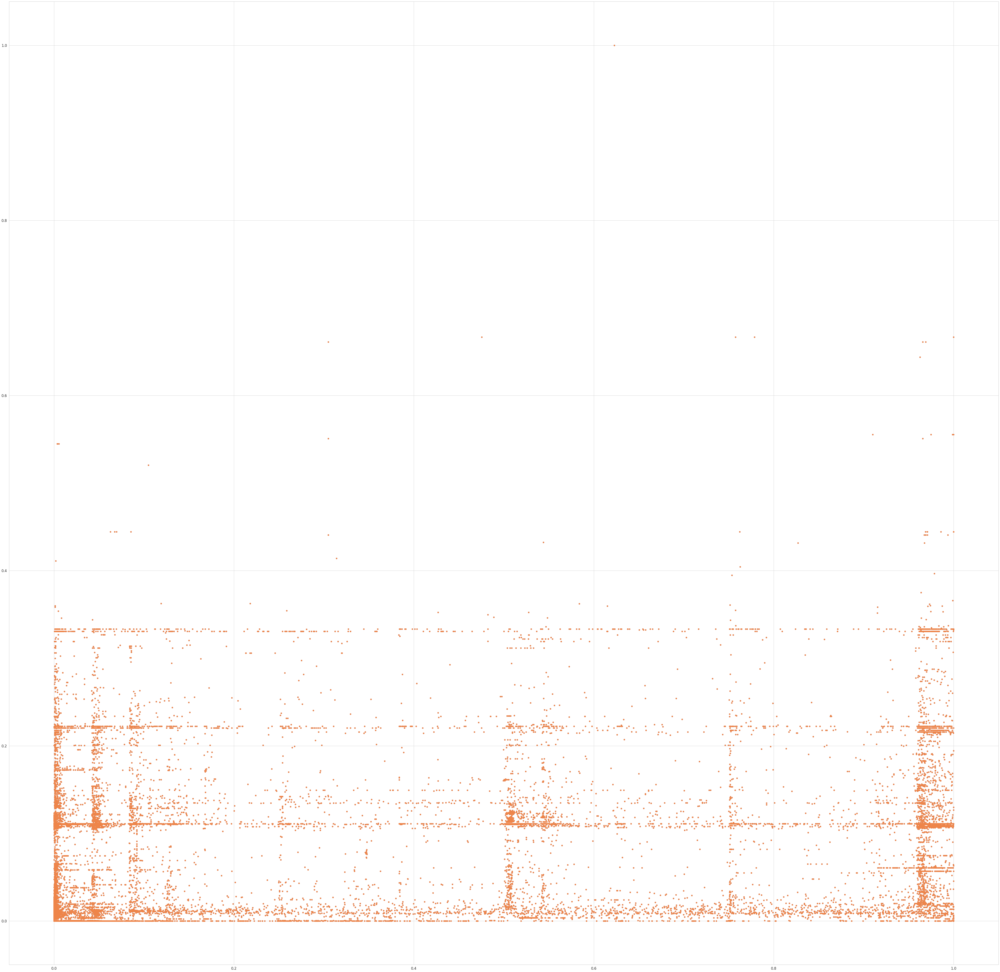

In [9]:
# 평균 0, 분산 1을 갖도록 스케일 조정
from sklearn.preprocessing import MinMaxScaler
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split


x=df_benign_corr_ont_hot_feature # Data Set 이름 설정 

x = x[:70000] 
scaler = MinMaxScaler()
scaler.fit(x)
scaled = scaler.transform(x)
df_benign_corr_scaled = pd.DataFrame(scaled,columns=x.columns,index=list(x.index.values))
#output = pd.DataFrame(df_, columns=df.columns, index=list(df.index.values))

display(df_benign_corr_scaled)


RANDOM_SEED = 42

X_train, X_test = train_test_split(df_benign_corr_scaled, test_size=0.3, random_state=RANDOM_SEED)
y_test = X_test[' Label_BENIGN']
X_train = X_train.values.astype('float64') # np.float32 로 바꿔서 해보자. 
X_test = X_test.values.astype('float64') #astype(float) -> astype(np.float32)
plt1=plt.scatter(X_train[:,0],X_train[:,1])
X, _ = make_blobs(n_samples= 200, centers= 5, random_state=4, cluster_std=1.5)
plt2= plt.scatter(X_train[:,0],X_train[:,1])

### AutoEncoder 모델 설계

In [10]:
X_train.shape
### INPUT = 19,20

input_dim = 20

input_layer = Input(shape=input_dim,)# 19 
encoder1 =Dense(17, activation='tanh')(input_layer) #17 
encoder2 =Dense(13, activation='relu')(encoder1)
encoder3 =Dense(10, activation='relu')(encoder2)
encoder4 =Dense(7, activation='relu')(encoder3)
Latent =Dense(5, activation='relu')(encoder4)
decoder1=Dense(7, activation='relu')(Latent)
decoder2=Dense(10, activation='relu')(decoder1)
decoder3=Dense(13, activation='relu')(decoder2)
decoder4=Dense(17, activation='relu')(decoder3)
output_layer=Dense(20, activation='tanh')(decoder4)


'''
### INPUT = 9

input_dim = 9

input_layer = Input(shape=input_dim,)# 19 
encoder1 =Dense(7, activation='relu')(input_layer)
encoder2 =Dense(5, activation='relu')(encoder1)
Latent =Dense(3, activation='relu')(encoder2)
decoder1=Dense(5, activation='relu')(Latent)
decoder2=Dense(7, activation='relu')(decoder1)
output_layer=Dense(9, activation='relu')(decoder2)

'''
autoencoder = Model(inputs=input_layer, outputs=output_layer)
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 20)]              0         
_________________________________________________________________
dense (Dense)                (None, 17)                357       
_________________________________________________________________
dense_1 (Dense)              (None, 13)                234       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                140       
_________________________________________________________________
dense_3 (Dense)              (None, 7)                 77        
_________________________________________________________________
dense_4 (Dense)              (None, 5)                 40        
_________________________________________________________________
dense_5 (Dense)              (None, 7)                 42    

### 학습 진행

In [11]:
nb_epoch = 100
batch_size = 32
adam = tf.keras.optimizers.Adam(learning_rate=0.01)
autoencoder.compile(optimizer=adam,
                    loss='mean_squared_error', 
                    metrics=['accuracy'])

checkpointer = ModelCheckpoint(filepath="model.h5", ## model 을 m5 파일 형태로 저장함. 
                               mode='min',
                               monitor='val_loss',
                               verbose=2,
                               save_best_only=True)


tensorboard = TensorBoard(log_dir='./logs',
                          histogram_freq=0,
                          write_graph=True,
                          write_images=True)


history = autoencoder.fit(X_train, X_train,
                    epochs=nb_epoch,
                    batch_size=batch_size,
                    shuffle=True,
                    validation_data=(X_test, X_test),
                    verbose=1,
                    callbacks=[checkpointer, tensorboard]).history

Epoch 1/100
1532/1532 [==============================] - 18s 3ms/step - loss: 0.0031 - accuracy: 0.6472 - val_loss: 0.0014 - val_accuracy: 0.7371

Epoch 00001: val_loss improved from inf to 0.00136, saving model to model.h5
Epoch 2/100
1532/1532 [==============================] - 3s 2ms/step - loss: 0.0012 - accuracy: 0.6973 - val_loss: 9.6510e-04 - val_accuracy: 0.5907

Epoch 00002: val_loss improved from 0.00136 to 0.00097, saving model to model.h5
Epoch 3/100
1532/1532 [==============================] - 3s 2ms/step - loss: 0.0011 - accuracy: 0.7063 - val_loss: 0.0012 - val_accuracy: 0.6576

Epoch 00003: val_loss did not improve from 0.00097
Epoch 4/100
1532/1532 [==============================] - 3s 2ms/step - loss: 0.0012 - accuracy: 0.7087 - val_loss: 0.0013 - val_accuracy: 0.6201

Epoch 00004: val_loss did not improve from 0.00097
Epoch 5/100
1532/1532 [==============================] - 3s 2ms/step - loss: 0.0011 - accuracy: 0.6978 - val_loss: 0.0010 - val_accuracy: 0.7009

Epoch

학습 loss 확인

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Unrecognized location 'uppe|right'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.
  # Remove the CWD from sys.path while we load stuff.


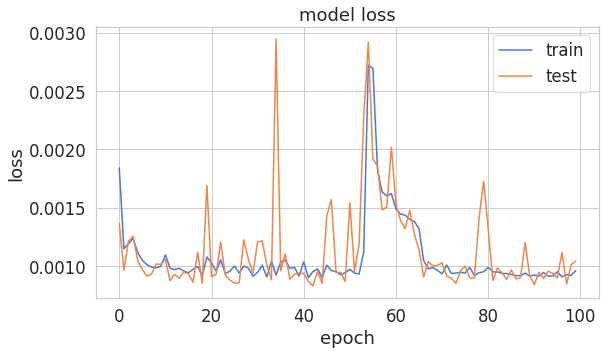

In [17]:
plt.figure(figsize=(9,5))

plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='uppe|right');

### 분포 / 성능확인

In [ ]:
autoencoder =load_model('/content/0807_AutoEncoder_Anomaly_Detecting.h5')

# 데이터 정규화 , 테스트 데이터 적용 
x=df_anomaly_test_ont_hot_feature
scaler = MinMaxScaler()
scaler.fit(x)
scaled = scaler.transform(x)


df_anomaly_test_scaled = pd.DataFrame(scaled,columns=x.columns,index=list(x.index.values))
predictions = autoencoder.predict(df_anomaly_test_scaled)

display(predictions)

predictions.shape

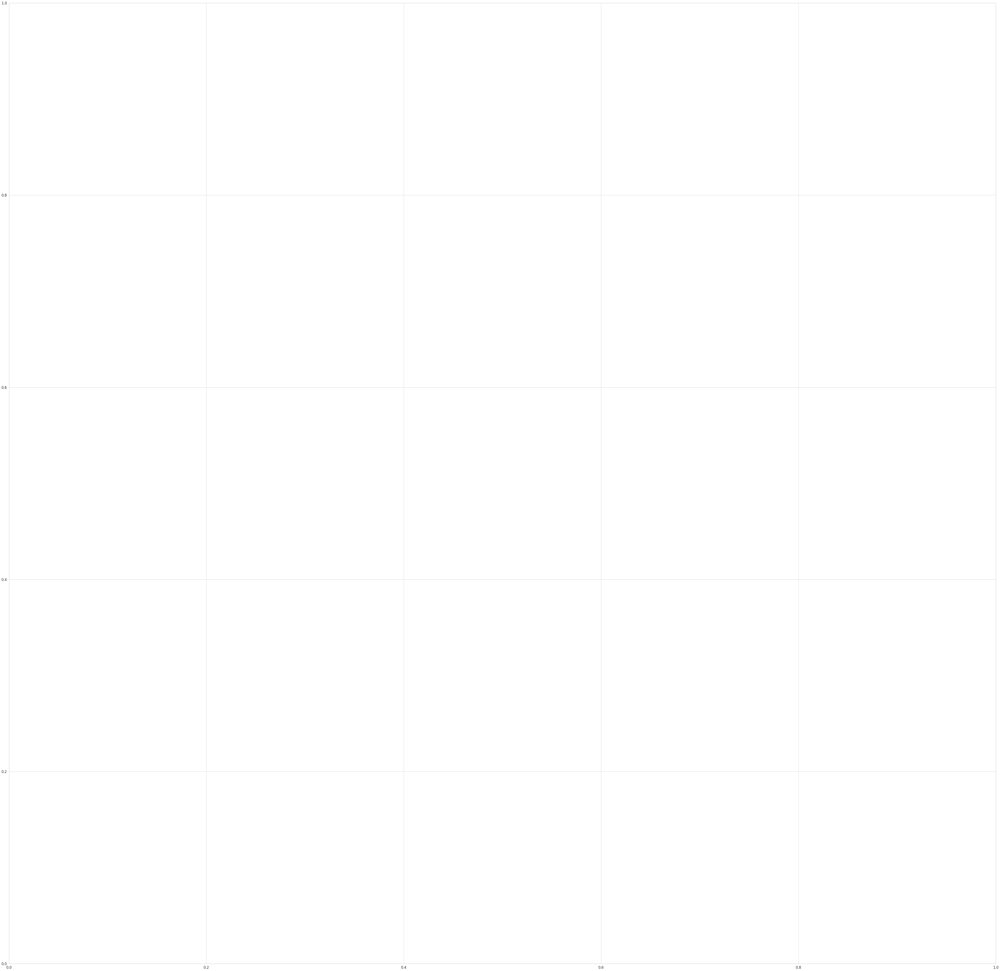

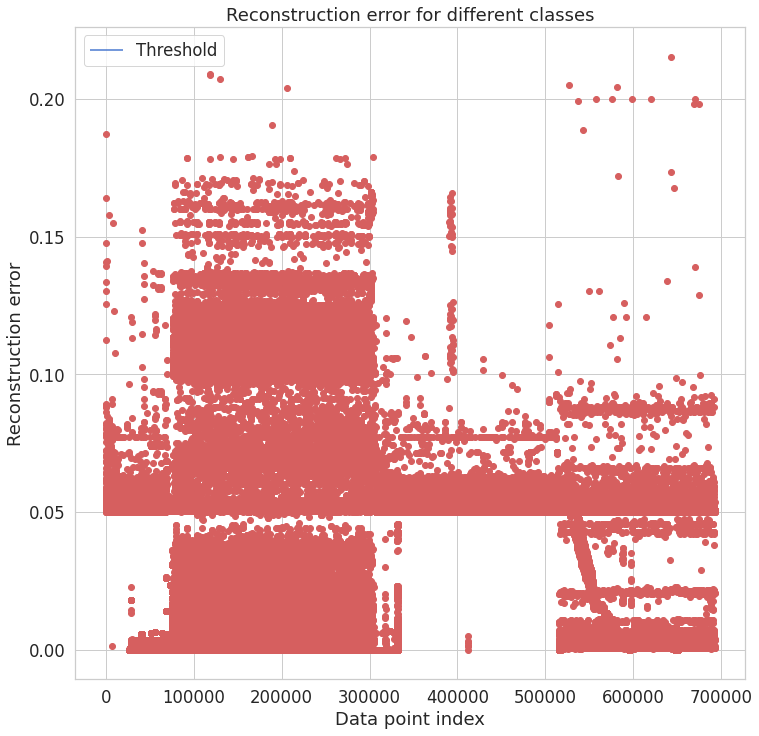

In [22]:
threshold = 0.05


fig, ax = plt.subplots()
#MSE 분석 
mse=np.mean(np.power(df_anomaly_test_scaled-predictions,2),axis=1)
plt.figure(figsize=(12,12))
plt.plot(mse,'ro')
plt.hlines(threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="b", zorder=100, label='Threshold')
plt.legend()
plt.title("Reconstruction error for different classes")
plt.ylabel("Reconstruction error")
plt.xlabel("Data point index")
plt.show()

### 조금 더 뚜렷한 시각화 

In [23]:
# 데이터 불러오기
# 데이터 전처리 
# 한게 df_anomaly_test_scaled
x=df_anomaly_test_scaled
y_test = x[' Label_BENIGN']
x.values.astype('float64')


predictions = autoencoder.predict(x)
mse = np.mean(np.power(x - predictions, 2), axis=1)
error_df = pd.DataFrame({'reconstruction_error': mse,
                        'true_class': y_test})
error_df.describe()

,reconstruction_error,true_class
count,692703.000000,692703.000000
mean,0.041832,0.635238
std,0.027930,0.481364
min,0.000031,0.000000
25%,0.010234,0.000000
50%,0.050352,1.000000
75%,0.050624,1.000000
max,0.215427,1.000000


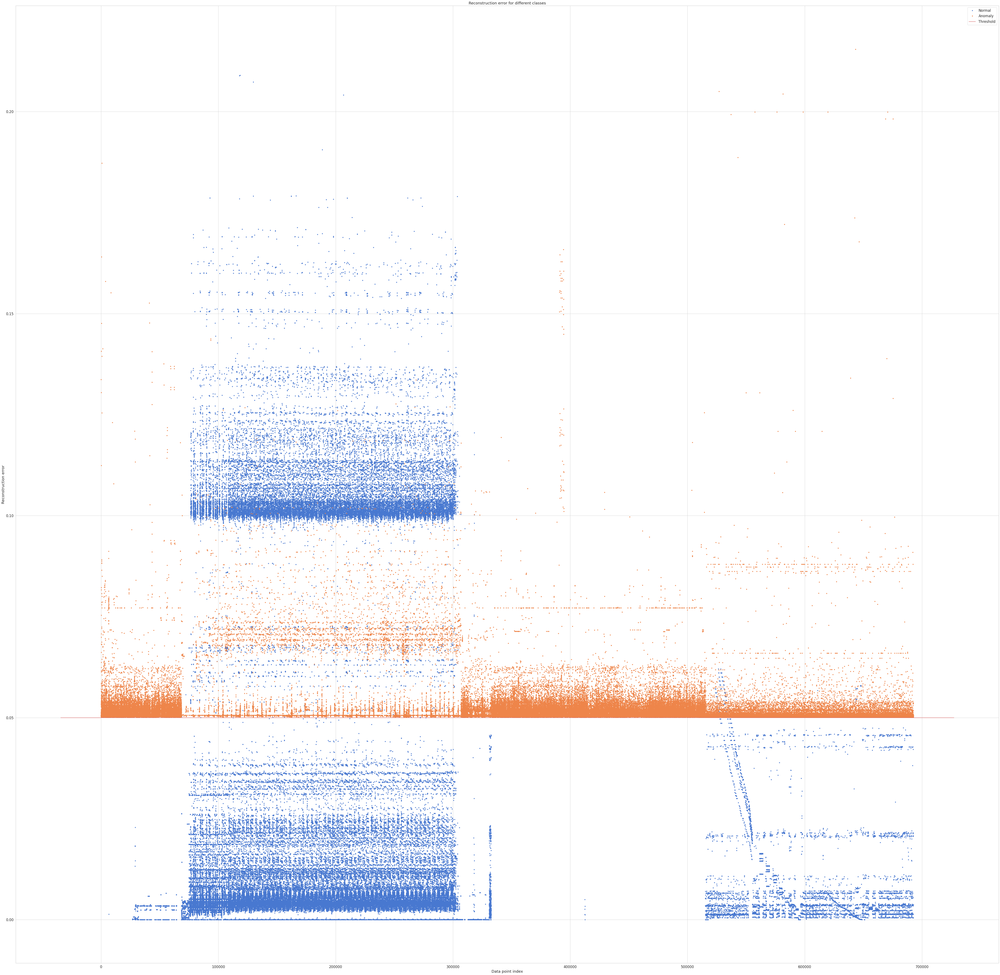

In [24]:
threshold=0.05

groups = error_df.groupby('true_class')
fig, ax = plt.subplots()

for name, group in groups:
    ax.plot(group.index, group.reconstruction_error, marker='o', ms=3.5, linestyle='',
            label= "Normal" if name == 0 else "Anomaly")
    
ax.hlines(threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="r", zorder=100, label='Threshold')
ax.legend()
plt.title("Reconstruction error for different classes")
plt.ylabel("Reconstruction error")
plt.xlabel("Data point index")
plt.show();

## Confusion Matrix

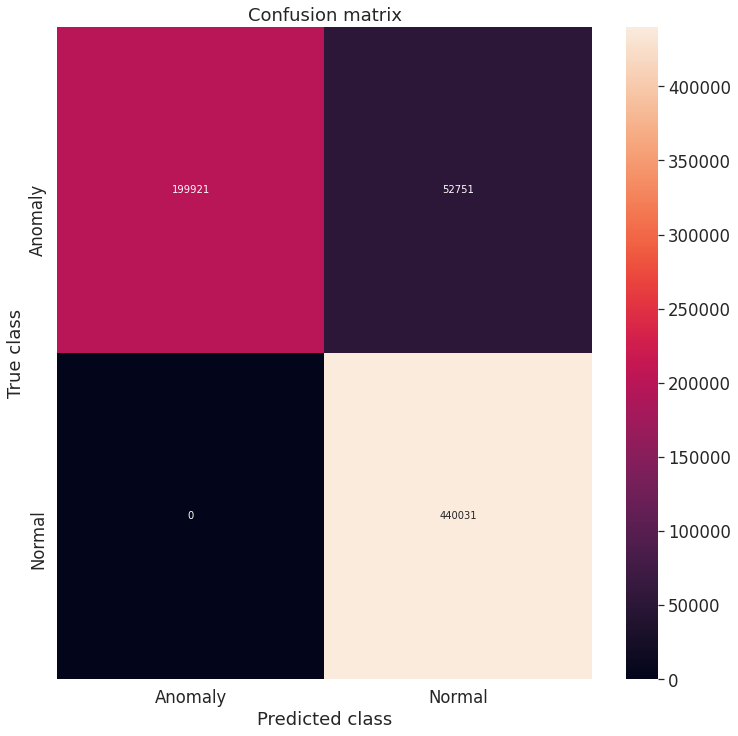

In [25]:
LABELS = ["Anomaly","Normal"]

y_pred = [1 if e > threshold else 0 for e in error_df.reconstruction_error.values]
conf_matrix = confusion_matrix(error_df.true_class, y_pred)
plt.figure(figsize=(12, 12))
sns.heatmap(conf_matrix, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

# 요약


### AutoEncoder 모델을 구성하여 CICIDS 2017 DataSet Anomaly Detecting 수행 

* 탐지 공격  
  1. DoS GoldenEyes
  2. DoS Hulk
  3. DoS SlowHTTPTest
  4. DOs Slowloris
  5. HeartBleed
  

정상과 정상이 아닌 공격으로만 구분하여 악성 플로우를 탐지 함


### 학습 과정 

CICIDS 2017 Monday-WorkingHours.pcap_ISCX.csv 데이터 중 70000개 추출

* One-hot-encoding

* Correlation 데이터 활용하여 78개 feature 중 20개 추출 

* Min-Max Normalization 사용

### 결과 

약 80% 정확도로 Anomaly Flow Detecting 에 성공하였으며.  
F1 Score 는 2* {(Precision * Recall )/ (Precision + Recall)}

* Precision (정답이라고 한 것 중 실제 정답 비율 ): True Positive / True Positives + False + Positives.  
  -> 1

* Recall ( 정답을 정답이라고 한 것 ): True Positives / ( True Positives + False Negetives )  
  -> 

따라서 F1 Score 는 2 * (1 * 0.89 / 1 + 0.89 ) = 0.94





